In [1]:
!pip install condacolab
!pip install MDAnalysis
import condacolab
condacolab.install_mambaforge()

!mamba install -c conda-forge openbabel=3.1.1 -c defaults
!mamba install -c conda-forge -c defaults nglview=3 -y
!mamba install ipywidgets=7.6.0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.5/108.5 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 90.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 86.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 97.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.8/48.8 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 3.9 MB/s eta 0:00:00
⏬ Downloading https://github.com/jaimergp/miniforge/releases/download/24.11.2-1_colab/Miniforge3-colab-24.11.2-1_colab-Linux-x86_64.sh...


Mambaforge has been sunset. It is now identical to Miniforge. Installing Miniforge...


📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:10
🔁 Restarting kernel...

Looking for: ['openbabel=3.1.1']

[+] 0.0s
pkgs/main/linux-64..  ⣾  [+] 0.1s
pkgs/main/linux-64..  ⣾  pkgs/main/linux-64 (check zst)                    
[+] 0.0s
pkgs/main/noarch (check zst)                       Checked  0.0s
[+] 0.0s
pkgs/r/linux-64 (c..  ⣾  pkgs/r/linux-64 (check zst)                       
[+] 0.0s
pkgs/r/noarch (che..  ⣾  pkgs/r/noarch (check zst)                         
[+] 0.0s
[+] 0.1s
conda-forge/linux-64  ⣾  
conda-forge/noarch    ⣾  
pkgs/main/linux-64     1%
pkgs/main/noarch      ⣾  
pkgs/r/linux-64       ⣾  pkgs/main/noarch                                  
pkgs/r/linux-64                                   
[+] 0.2s
conda-forge/linux-64   1%
conda-forge/noarch    ⣾  
pkgs/main/linux-64    35%
pkgs/r/noarch         ⣾  [+] 0.3s
conda-forge/linux-64   5%
conda-forge/noarch     7%
pkgs/main/linux-64    68%
pkgs/r/noarch         12%[+] 0.4s
conda-fo

In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nglview as nv
import MDAnalysis as mda
from MDAnalysis.analysis import rms, diffusionmap, align
from MDAnalysis.analysis.distances import dist
from MDAnalysis.analysis.hydrogenbonds.hbond_analysis import HydrogenBondAnalysis as HBA

In [2]:
from google.colab import output
output.enable_custom_widget_manager()

Support for third party widgets will remain active for the duration of the session. To disable support:

In [3]:
from google.colab import output
output.disable_custom_widget_manager()

In [45]:
HERE = Path(_dh[-1])
DATA = HERE / "data"

### Load and visualize the system

As the first step, we load the topology (`.pdb`) and the trajectory (`.xtc`) files to create an MDAnalysis `universe` representing the simulated system.
The universe can easily be visualized in its entirety, including the animation of the trajectory.

[NGL Viewer](http://nglviewer.org/) provides pre-build functions to visualize simulations loaded in common libraries such as MD Analysis.

In [64]:
!obabel topology.pdb -O fixed_topology.pdb

1 molecule converted


In [65]:
md_universe = mda.Universe(str("fixed_topology.pdb"), str("trajectory.xtc"))
view = nv.show_mdanalysis(md_universe)
view


NGLWidget(max_frame=99)

Support for third party widgets will remain active for the duration of the session. To disable support:

In [66]:
view.render_image(trim=True, factor=2, transparent=True);

In [67]:
view._display_image()

### Alignment

Although barely noticable in the visualization of this rather short trajectory, depending on the used simulation package/settings proteins can rotate and translate during simulation. This can complicate visual inspection of the trajectory and usually requires an alignment as as prior step to analysis. A common selection for aligning a trajectory on is the protein. Thus, the protein will not deviate from the center and not rotate allowing the observation of unbinding events or conformational changes.

The [MDAnalysis](https://docs.mdanalysis.org/stable/index.html) framework allows for easy alignment on an atom selection using strings and has built-in simple selection keywords as well, for example "protein", which selects all residues usually belonging to the protein.

In the next step, we will align the structures of the trajectory (mobile) onto the reference structure. The frame currently active in the reference structure will be used for alignment.

In [68]:
# Set trajectory pointer to first frame as reference
md_universe.trajectory[0]

# in_memory=True is needed to actually modify the loaded trajectory
# if the trajectory is too big for memory, one can write out the aligned trajectory and reload it into a new universe
alignment = align.AlignTraj(
    mobile=md_universe, reference=md_universe, select="protein", in_memory=True
)
alignment.run()

In [69]:
view = nv.show_mdanalysis(md_universe)
view

NGLWidget(max_frame=99)

In [70]:
view.render_image(trim=True, factor=2, transparent=True);

In [71]:
view._display_image()

### RMSD of protein and ligand

Protein and ligand are clearly distinguishable in the animation. However, it is hard to estimate if ligand or protein actually significantly change their position/conformation. Hence, we will evaluate the relative movement using a more suffisticated method, the calculation of the RMSD. We will thereby focus on different portions of the system (backbone, protein and ligand). The ligand is best selected by its distinct residue name. In this case, we know it is the inhibitor `03P`, but we could also find the name from either inspecting the topology file or hovering the cursor over a ligand atom in the animation above.

In [72]:
ligand_name = "UNK"

#### RMSD over time

For plotting the RMSD, we write a function that does the RMSD calculation for selected atom groups from the universe and returns a pandas `Dataframe`.

In [73]:
def rmsd_for_atomgroups(universe, selection1, selection2=None):
    """Calulate the RMSD for selected atom groups.

    Parameters
    ----------
    universe: MDAnalysis.core.universe.Universe
        MDAnalysis universe.
    selection1: str
        Selection string for main atom group, also used during alignment.
    selection2: list of str, optional
        Selection strings for additional atom groups.

    Returns
    -------
    rmsd_df: pandas.core.frame.DataFrame
        DataFrame containing RMSD of the selected atom groups over time.
    """

    universe.trajectory[0]
    ref = universe
    rmsd_analysis = rms.RMSD(universe, ref, select=selection1, groupselections=selection2)
    rmsd_analysis.run()
    columns = [selection1, *selection2] if selection2 else [selection1]
    rmsd_df = pd.DataFrame(np.round(rmsd_analysis.results.rmsd[:, 2:], 2), columns=columns)
    rmsd_df.index.name = "frame"
    return rmsd_df

Run the function to calculate the RMSD for the selected molecules during the simulation:

* whole protein
* protein backbone atoms
* ligand

During the calculation, the molecule will be superimposed to the first frame (reference) along the backbone of the protein.

In [74]:
rmsd = rmsd_for_atomgroups(md_universe, "backbone", ["protein", f"resname {ligand_name}"])
rmsd.head(200)

,backbone,protein,resname UNK
frame,,,
0,0.00,0.00,0.00
1,0.69,1.02,0.73
2,0.82,1.15,1.48
3,0.97,1.27,1.42
4,1.02,1.37,2.13
...,...,...,...
95,1.68,2.21,2.44
96,1.83,2.30,2.25
97,1.78,2.24,2.10


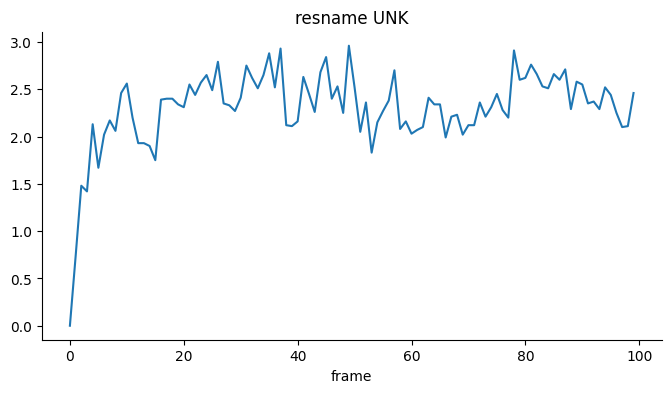

In [75]:
# @title resname UNK

from matplotlib import pyplot as plt
rmsd['resname UNK'].plot(kind='line', figsize=(8, 4), title='resname UNK')
plt.gca().spines[['top', 'right']].set_visible(False)

Then, we plot the results.

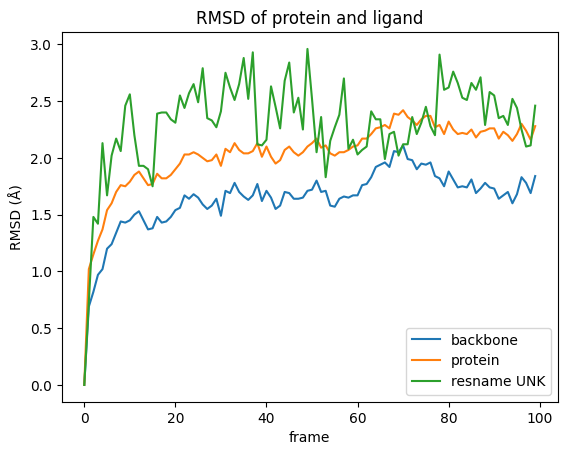

In [76]:
rmsd.plot(title="RMSD of protein and ligand")
plt.ylabel("RMSD (Å)");

What can we see in the plot:

* There are only slight conformational changes in the backbone during the simulation, which is not surprising since the protein was superimposed w.r.t. the backbone.
* Including the protein side chains in RMSD calculation lead to more movement, when compared to the protein backbone only.
* In our simulation the ligands movements are in the same range as the protein side chains. However, this is not always the case as the ligand can move more freely and, additionally to any conformational changes, there might be directional movement involved. This is likely the case if the RMSD values for the ligand are exceptionally high.

#### RMSD between frames

The plot before showed the distance at the given time compared to the initial state.
Now, we calculate the differences between all frames (pair-wise) and visualize them in a heatmap.

In [77]:
def RMSD_dist_frames(universe, selection):
    """Calculate the RMSD between all frames in a matrix.

    Parameters
    ----------
    universe: MDAnalysis.core.universe.Universe
        MDAnalysis universe.
    selection: str
        Selection string for the atomgroup to be investigated, also used during alignment.

    Returns
    -------
    array: np.ndarray
        Numpy array of RMSD values.
    """
    pairwise_rmsd = diffusionmap.DistanceMatrix(universe, select=selection)
    pairwise_rmsd.run()
    return pairwise_rmsd.results.dist_matrix

First, we calculate the distance matrices for protein and ligand using the function above.
Then, we plot them side by side as heatmaps.

In [78]:
dist_matrix_protein = RMSD_dist_frames(md_universe, "protein")
dist_matrix_ligand = RMSD_dist_frames(md_universe, f"resname {ligand_name}")

In order to achieve comparable heatmaps, it is important to set the minima and maxima in both plots to the same values.
We set the minimal value to 0 and derive the upper bound from the distance matrices.

In [79]:
# get maximal distance between all frames
max_dist = max(np.amax(dist_matrix_ligand), np.amax(dist_matrix_protein))

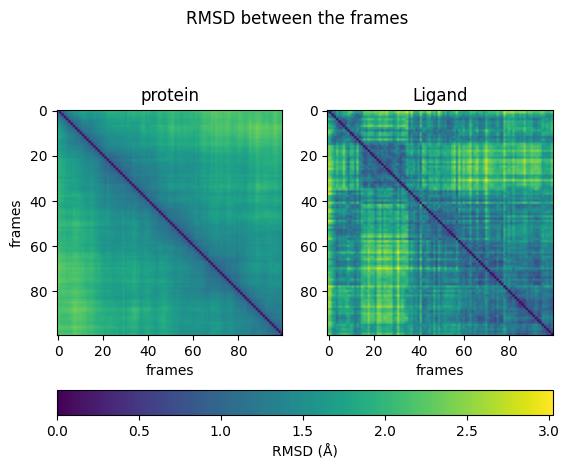

In [80]:
fig, ax = plt.subplots(1, 2)
fig.suptitle("RMSD between the frames")

# protein image
img1 = ax[0].imshow(dist_matrix_protein, cmap="viridis", vmin=0, vmax=max_dist)
ax[0].title.set_text("protein")
ax[0].set_xlabel("frames")
ax[0].set_ylabel("frames")

# ligand image
img2 = ax[1].imshow(dist_matrix_ligand, cmap="viridis", vmin=0, vmax=max_dist)
ax[1].title.set_text("Ligand")
ax[1].set_xlabel("frames")

fig.colorbar(img1, ax=ax, orientation="horizontal", fraction=0.1, label="RMSD (Å)");

From the heatmaps, we can conclude that the protein moves constantly and evenly between the states. The ligand *jumps* between different states. Sometimes it can reach similar conformations repeatedly.

### Interaction analysis

Now, we will look at the interaction between protein and ligand. Let's visualize the system again, including some more detail in the binding pocket. All residues in a 5 Å radius around the ligand are shown with atoms and bonds visible.

In [63]:
# select pocket residues
pocket_resids = set(
    md_universe.select_atoms(f"(around 5 resname {ligand_name}) and protein").resids
)
view2 = nv.show_mdanalysis(md_universe)
view2.add_representation(
    "licorice", selection=f"protein and ({' '.join([str(x) for x in pocket_resids])})"
)
view2.center(selection="ligand")
view2

NGLWidget(max_frame=99)

In [39]:
view2.render_image(trim=True, factor=2, transparent=True);

In [40]:
view2._display_image()

#### Atomic distances

We now zoom in and look for interactions that might be of interest for a project at hand. In this example, we want to look at the backbone nitrogen of methionine 793 coming in close contact with an aromatic ring of the ligand. Theoretically, the distances can be calculated for groups of atoms, as long as each group has the same number of atoms, but we want to look at distances between single atoms.
Single atom selections can be done unambiguously with the combination of residue id and atom name inside that residue. Residue names are not unique and thus are not be used here.
Atom names and their corresponding residue id can be accessed when hovering over the selected atom in the detailed view above.

In [41]:
protein_residue_id = "793"
protein_atom_name = "N"
ligand_id = "1"
ligand_atom_name = "N4"

We select the atom groups used for our analysis, which will contain one atom each in this example.

In [42]:
atomgroup_protein = md_universe.select_atoms(
    f"resid {protein_residue_id} and name {protein_atom_name}"
)
atomgroup_ligand = md_universe.select_atoms(f"resname {ligand_name} and name {ligand_atom_name}")

Now, we can calculate the distance between the atoms in the currently set frame of our universe (using the `dist`function from `MDAnalysis`).
The function returns an array of arrays: The first two elements are the residue ids, but we are only interested in the third entry, the distance.

In [43]:
distance = dist(atomgroup_protein, atomgroup_ligand)
print(
    f"The distance between residues {protein_residue_id} and {ligand_id} is {distance[2][0]:.2f} Å"
)

ValueError: AtomGroups A and B do not have the same number of atoms

At 3.5Å the distance is close enough to play a role in mediating the binding of the ligand and is worth a closer look. The interaction between the ligand and the backbone nitrogen of methionine 793 we just measured is actually a well known bond with the hinge region in many kinases.

To gather more information we want to look at the development of the distance over time. We can iterate over the frames and calculate the distance for each of them. The trajectory property of the universe works as a pointer and only holds information about one time step. The pointer is moved along the trajectory file, any selections are automatically updated on the way.

In [ ]:
distances = []
for _ in md_universe.trajectory:
    distance = dist(atomgroup_protein, atomgroup_ligand)
    distances.append(distance[2][0])

ValueError: AtomGroups A and B do not have the same number of atoms

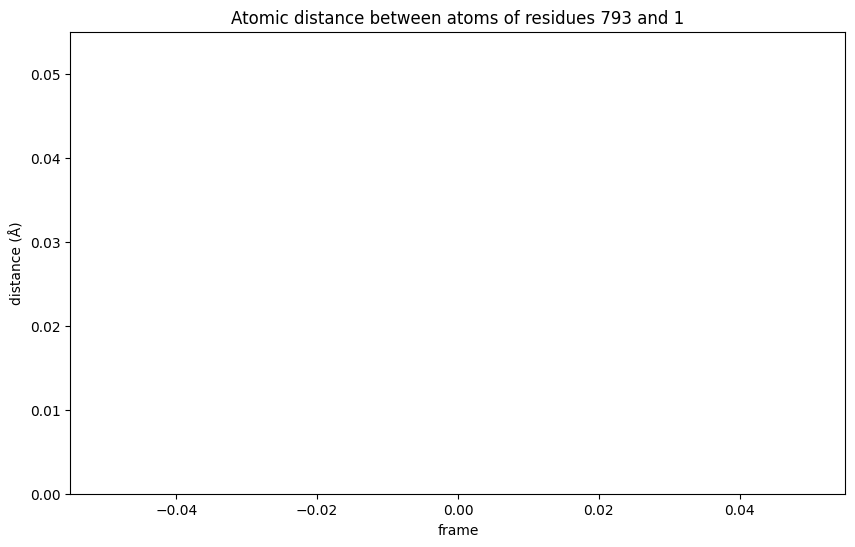

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.gca().set_ylim(bottom=0)
plt.ylabel("distance (Å)")
plt.xlabel("frame")
plt.title(f"Atomic distance between atoms of residues {protein_residue_id} and {ligand_id}")
plt.show()

From the graphic we see that during the interaction the distance becomes shorter than the initially observed 3.52 Å in the first frame. This means the interaction gets stronger at first and, although fluctuating, stays relatively stable for extended periods.

#### Hydrogen bond analysis

As it happens, the interaction with the hinge region we are analyzing forms a hydrogen bond. The nitrogen of the backbone from methionine is acting as the donor, the nitrogen in the aromatic ring of the ligand is the acceptor.

We go back to the visualization to get the unique name of the hydrogen forming the bond .Then, we can use the hydrogen bond analysis capability from [MDAnalysis](https://docs.mdanalysis.org/1.0.0/documentation_pages/analysis/hydrogenbonds.html) to determine the characteristic distances and angles for the hydrogen bond. The hydrogen bond analysis covers all frames without manual iteration and is convenient to plot.

In [ ]:
hydrogen_name = "H"

In [ ]:
def run_hydrogenbond_analysis(
    universe,
    donor_resid,
    donor_atom,
    hydrogen_atom,
    acceptor_resid,
    acceptor_atom,
    h_cutoff=1.2,
    a_cutoff=3.0,
    angle_cutoff=120,
):
    """
    Perform an hydrogen bond analysis between selcted atom groups.
    Return the data as readable, formatted data frame.

    Parameters
    ----------
    universe: MDAnalysis.core.universe.Universe
        MDAnalysis universe.
    donor_resid: str
        Residue Id of residue containing donor atom in MDAnalysis universe.
    donor_atom: str
        Name of the donor atom in the MDAnalysis universe.
    hydrogen_atom: str
        Name of involved hydrogen atom in the MDAnalysis universe.
    acceptor_resid: str
        Residue Id of residue containing acceptor atom in the MDAnalysis universe.
    acceptor_atom: str
        Name of the acceptor atom in the MDAnalysis universe.
    h_cutoff: float, optional
        Distance cutoff used for finding donor-hydrogen pairs.
    a_cutoff: float, optional
        Donor-acceptor distance cutoff for hydrogen bonds.
    angle_cutoff: int, optional
        D-H-A angle cutoff for hydrogen bonds.

    Returns
    -------
    bond : pandas.core.frame.DataFrame
        DataFrame containing hydrogen bond information over time.
    """

    # set up and run the hydrogen bond analysis (HBA)
    hbonds = HBA(
        universe=universe,
        donors_sel="resid " + donor_resid + " and name " + donor_atom,
        hydrogens_sel="resid " + donor_resid + " and name " + hydrogen_atom,
        acceptors_sel="resid " + acceptor_resid + " and name " + acceptor_atom,
        d_h_cutoff=h_cutoff,
        d_a_cutoff=a_cutoff,
        d_h_a_angle_cutoff=angle_cutoff,
    )
    hbonds.run()
    # extract bond data
    bond = pd.DataFrame(np.round(hbonds.results.hbonds, 2))
    # name columns (according to MDAnalysis function description)
    bond.columns = [
        "frame",
        "donor_index",
        "hydrogen_index",
        "acceptor_index",
        "distance",
        "angle",
    ]
    # set frame as the index
    bond["frame"] = bond["frame"].astype(int)
    bond.set_index("frame", inplace=True, drop=True)
    return bond

We run the hydrogen bond analysis using our function, which returns a data frame.

In [ ]:
bond = run_hydrogenbond_analysis(
    md_universe, protein_residue_id, protein_atom_name, hydrogen_name, ligand_id, ligand_atom_name
)
bond.head()

,donor_index,hydrogen_index,acceptor_index,distance,angle
frame,,,,,
17,1483.0,1484.0,5529.0,2.87,144.73
21,1483.0,1484.0,5529.0,2.98,162.87
23,1483.0,1484.0,5529.0,2.98,173.41
26,1483.0,1484.0,5529.0,3.00,175.31
28,1483.0,1484.0,5529.0,2.95,163.73


In the table, we can see that the bond is only recognized in some frames during the simulation.

The used module searches for hydrogen bonds with strict predefined constraints. Using default settings, the bond is only detected if the distance larger than 3Å between donor and acceptor and smaller than 1.2Å between donor and hydrogen and if the angle is larger than 120° (see Figure 1). The bond will not be included for frames that do not meet the constraints.

To trace the bond over the entire simulation, we can change those thresholds to detect the bond in its "weaker" states.
From the above table, the angles seem to be sufficiently high, while the distances are closer to the 3Å cutoff distance. Thus, we try the analysis again with a higher distance cutoff of 5Å for the donor and acceptor distance.

In [ ]:
bond = run_hydrogenbond_analysis(
    md_universe,
    protein_residue_id,
    protein_atom_name,
    hydrogen_name,
    ligand_id,
    ligand_atom_name,
    a_cutoff=5.0,
)
bond.head()

,donor_index,hydrogen_index,acceptor_index,distance,angle
frame,,,,,
0,1483.0,1484.0,5529.0,3.52,166.39
1,1483.0,1484.0,5529.0,3.60,145.63
2,1483.0,1484.0,5529.0,3.13,173.95
3,1483.0,1484.0,5529.0,3.29,151.99
4,1483.0,1484.0,5529.0,3.20,170.21


Now, we plot the bond.

In [ ]:
def plot_hydrogen_bond_over_time(bond):
    """
    Plot the distance and degree of a chosen hydrogen bond over time.
    Peaks in angle and dips in distance represent moments of strong binding.

    Parameters
    ----------
    bond: pandas.core.frame.DataFrame
        Hydrogen bond analysis data frame with named columns.
    """

    donor_index = bond.iloc[0].donor_index
    acceptor_index = bond.iloc[0].acceptor_index

    # add values for missing frames for gapless plotting
    bond = bond.reindex(np.arange(0, 99))

    # plot the data
    fig = plt.figure(figsize=(10, 6))
    distance = bond.distance.plot(
        title=f"H-Bond between donor {donor_index} and acceptor {acceptor_index}",
        style="o-",
        x="frame",
    )
    distance.set_ylabel("distance (Å)")
    distance.set_xlabel("frame")
    distance.set_ylim(bottom=0)
    angle = bond.angle.plot(secondary_y=True, style="o-", x="frame")
    angle.set_ylabel("angle (°)")
    angle.set_xlabel("frame")
    angle.set_ylim(bottom=0)
    fig.legend(loc="lower right", bbox_to_anchor=(1, 0), bbox_transform=distance.transAxes)
    plt.show()

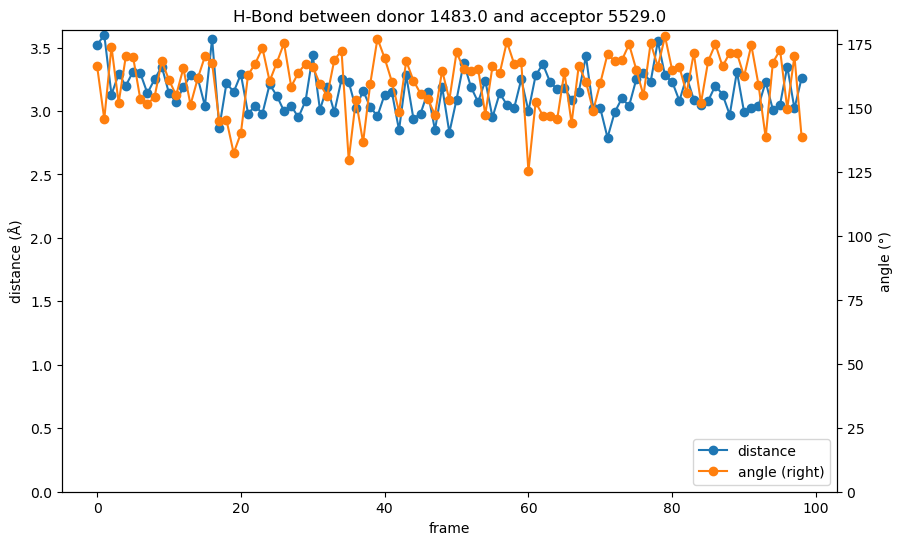

In [ ]:
plot_hydrogen_bond_over_time(bond)

While the distance values in the hydrogen bond analysis are the same we have seen in the pure distance plot above, the combination with the bond angle elevates the information. As mentioned before, the distance is at the upper end for hydrogen bond lengths throughout the simulation, but the bond angle is consistently close to 180° and stabilizes the bond. From the analysis we could assume that the interaction between the backbone methionine in the kinase hinge region is indeed a crucial factor for the binding of the ligand.

In [ ]:
view_strong = nv.show_mdanalysis(md_universe)
view_strong.add_representation("ball+stick", selection=f"protein and {protein_residue_id}")
view_strong.center(selection="ligand")
view_strong.frame = 71
view_strong

NGLWidget(frame=71, max_frame=99)

In [ ]:
view_bad = nv.show_mdanalysis(md_universe)
view_bad.add_representation("ball+stick", selection=f"protein and {protein_residue_id}")
view_bad.center(selection="ligand")
view_bad.frame = 1
view_bad

NGLWidget(frame=1, max_frame=99)

## Discussion

There are various ways to analyze MD simulations. In this talktorial, we explored only a small fraction of available methods to give the user first insights. Some methods are more straightforward, like the visualization of the system or the calculation of the RMSD, while others require more finesse. Especially the hydrogen bond analysis is yet dependent on manual input and tweaking. But with further advancements in the field, we can expect the frameworks to become more and more refined.

The MD simulation used during analysis is actually too short to provide statistical significant data on binding and unbinding events or even conformational changes of the protein or ligand. To make full use of the capabilities of MD simulations one needs access to high performance clusters. Great examples on insights gained from MD simulations can be found on the webpage of the [Folding@home](https://foldingathome.org/) consortium, which connects computers world wide to address pressing scientific challenges.

## Quiz

- Which hydrogen bond would you consider the strongest?
    - A: donor acceptor distance = 3.5 Å, donor hydrogen acceptor angle = 180°
    - B: donor acceptor distance = 2.7 Å, donor hydrogen acceptor angle = 170°
    - C: donor acceptor distance = 3.2 Å, donor hydrogen acceptor angle = 150°
- Try to align the trajectory on the ligand. How does this affect the RMSD plots?
- Choose a second pair of atoms and analyse the interactions.
- Are you able to implement a function to calculate the root mean square fluctuations (RMSF) of protein residues?